In [27]:
from __future__ import division
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import glob
import math
import scipy as sp

In [106]:
import warnings
warnings.filterwarnings("ignore")
size = 0
files = 0
bad = 0
bad_event = 0

for file_name in glob.glob('/home/dup193/work/double_pulse/reform_wf/data_earlywf/*.npz'):
    x = np.load(file_name, allow_pickle=True, encoding = 'bytes')['arr_0']
    size += len(x)
    files +=1
    for i in x: 
        if abs(i[b'time_o'][0]-i[b'time_r'][0]) >1000:
            bad+=1
    flag =False
    for i in x: 
        if abs(i[b'time_o'][0]-i[b'time_r'][0]) >1000:
            flag =True
    if flag:
        bad_event+=1
print(size,bad,files,bad_event)    

286 0 47 0


In [107]:
for file_name in glob.glob('/home/dup193/work/double_pulse/reform_wf/*.npz')[:15]:
    x = np.load(file_name, allow_pickle=True, encoding = 'bytes')['arr_0']
    for i in x:
        fig = plt.figure(figsize=(20, 5),facecolor ='w')
        
        ax = fig.add_subplot(111)
        plt.rcParams.update({'font.size': 16})
        plt.ticklabel_format(axis='both', style='sci', scilimits=(-5,5))
        ax.set_xscale('linear')
        ax.set_yscale('log')
        ax.set_title('Waveforms and Pulses', fontsize = 16)
        txt = "Qdom = {0:.2f} PE, ID = {1}_{2}_{3}_{4}, Pulse interval = [{5:.2f},{6:.2f}]".format(i[b'q'],i[b'run_id'],i[b'sub_run_id'],i[b'event_id'],i[b'sub_event_id'],np.min(i[b'pulse_t']),np.max(i[b'pulse_t']))
        ax.text(0.01,0.93,txt, transform=ax.transAxes, color = "black",fontsize=16)
        ax.set_xlim(np.min([i[b'time_o'][0],i[b'time_r'][0]]),np.max([i[b'time_o'][127],i[b'time_r'][127]]))
        ax.set_ylim(10**(-10),10**(2))
        ax.set_xlabel('Time', fontsize = 16)                                                              
        ax.set_ylabel("units", fontsize = 16)                                                   
        ax.scatter(i[b'time_o'][:128],i[b'wfm_o']/10**(-8), s=10, label = "original")  
        ax.scatter(i[b'time_r'],i[b'wfm_r']/10**(-8), s=10,label = "reformed")  
        ax2 = ax.twinx()  # instantiate a second axes that shares the same x-axis
        ax2.stem(i[b'pulse_t'],i[b'pulse_q'],linefmt='grey', markerfmt='rD',label = "pulses")  
        ax2.set_ylabel("Pulse Charge, PE", fontsize = 16) 
        ax2.set_ylim(0,5*10**(2))
        fig.legend(loc="upper right", bbox_to_anchor=(1,1), bbox_transform=ax.transAxes)

In [100]:
import warnings
warnings.filterwarnings("ignore")
size = 0
files = 0
bad = 0
for file_name in glob.glob('/home/dup193/work/double_pulse/reform_wf/corsika/*.npz'):
    x = np.load(file_name, allow_pickle=True, encoding = 'bytes')['arr_0']
    size += len(x)
    files +=1
    for i in x: 
        if abs(i[b'time_o'][0]-i[b'time_r'][0]) >1000:
            bad+=1
print(size,bad,files)    

2409 2 42


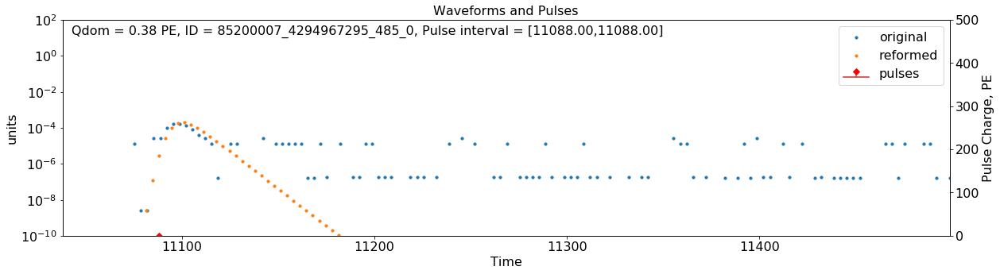

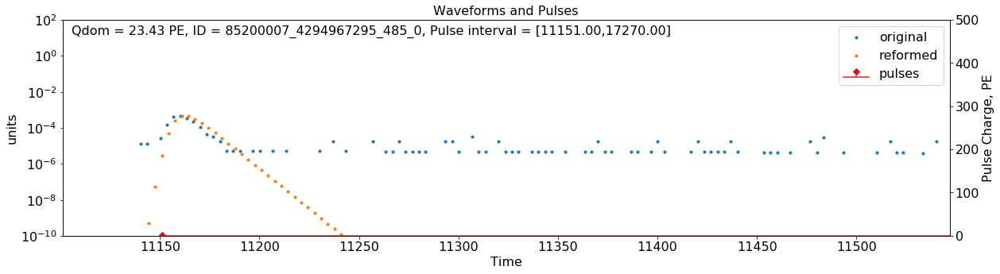

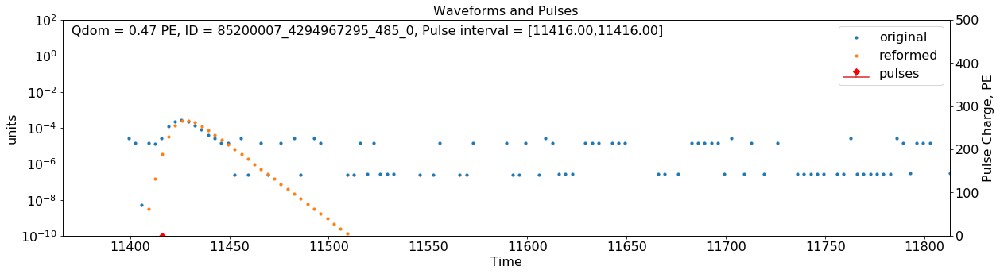

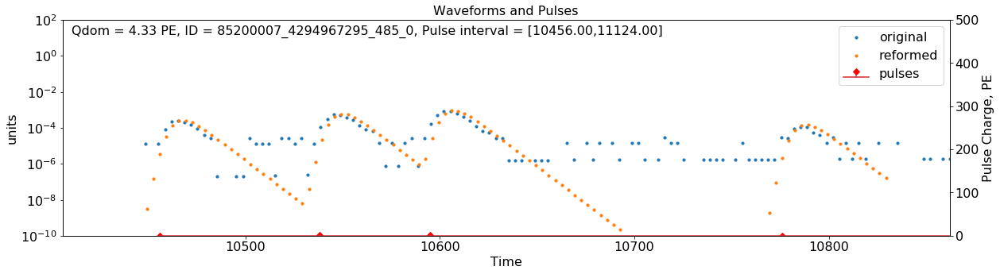

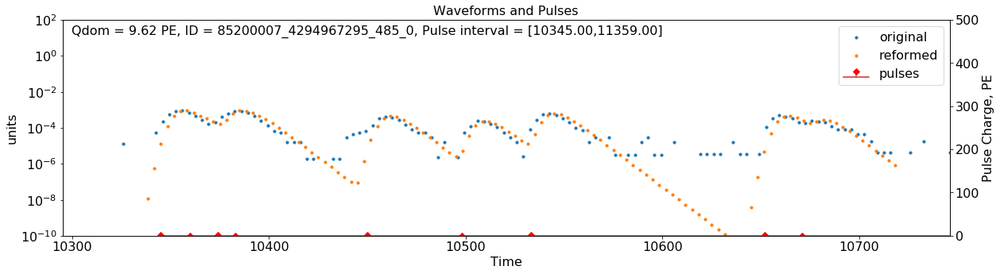

...

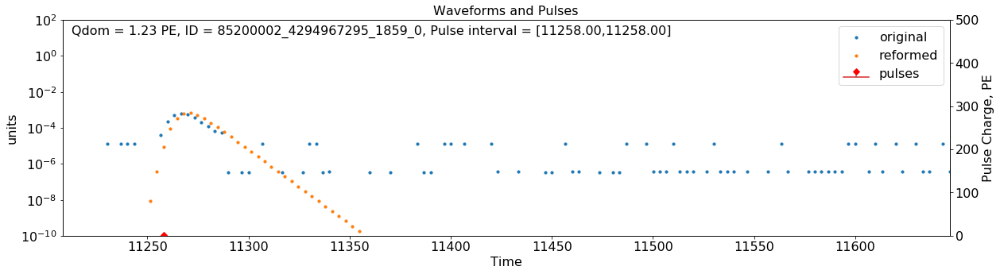

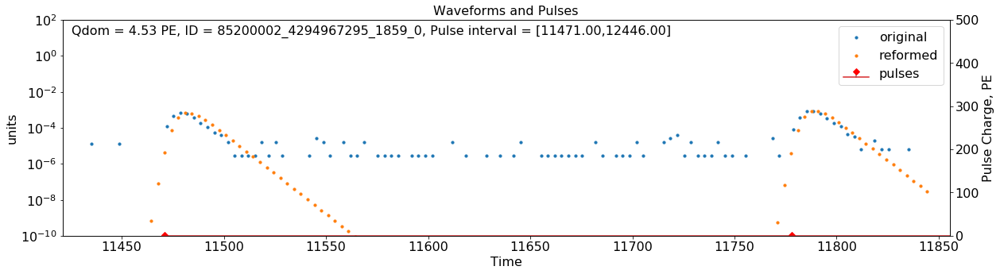

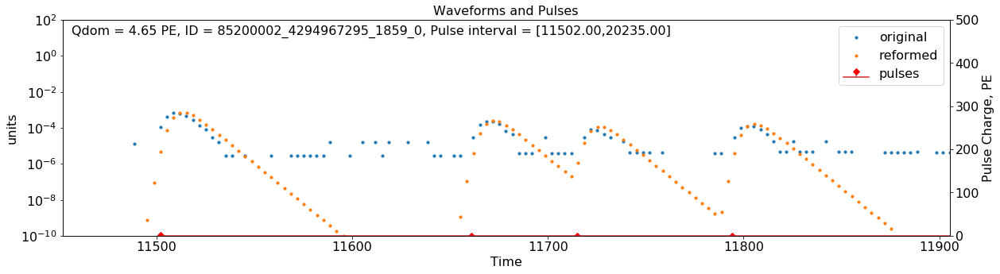

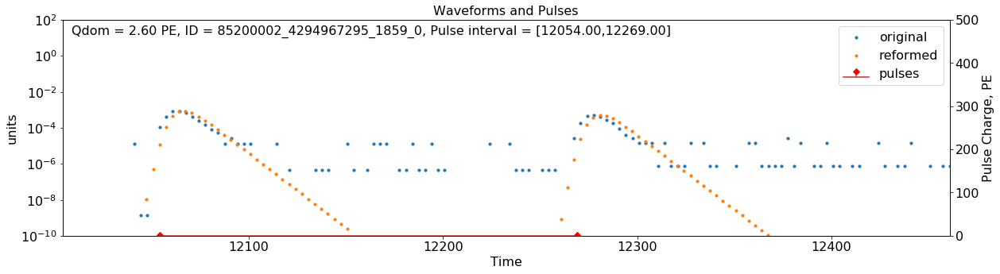

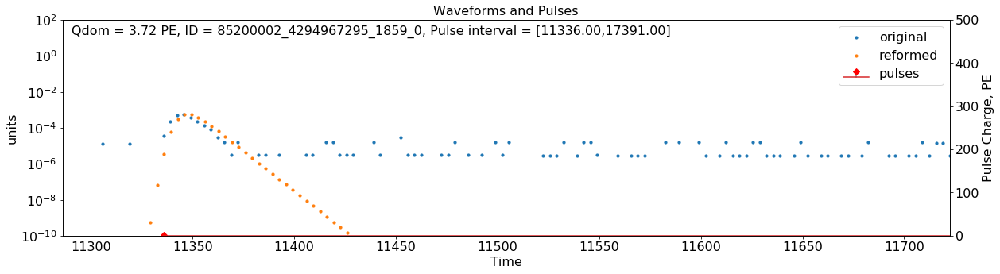

In [103]:
for file_name in glob.glob('/home/dup193/work/double_pulse/reform_wf/corsika/*.npz')[:5]:
    x = np.load(file_name, allow_pickle=True, encoding = 'bytes')['arr_0']
    for i in x:
        #if abs(i[b'time_o'][0]-i[b'time_r'][0]) <1000:
        #    continue
        fig = plt.figure(figsize=(20, 5),facecolor ='w')
        
        ax = fig.add_subplot(111)
        plt.rcParams.update({'font.size': 16})
        plt.ticklabel_format(axis='both', style='sci', scilimits=(-5,5))
        ax.set_xscale('linear')
        ax.set_yscale('log')
        ax.set_title('Waveforms and Pulses', fontsize = 16)
        txt = "Qdom = {0:.2f} PE, ID = {1}_{2}_{3}_{4}, Pulse interval = [{5:.2f},{6:.2f}]".format(i[b'q'],i[b'run_id'],i[b'sub_run_id'],i[b'event_id'],i[b'sub_event_id'],np.min(i[b'pulse_t']),np.max(i[b'pulse_t']))
        ax.text(0.01,0.93,txt, transform=ax.transAxes, color = "black",fontsize=16)
        ax.set_xlim(np.min([i[b'time_o'][0],i[b'time_r'][0]]),np.max([i[b'time_o'][127],i[b'time_r'][127]]))
        ax.set_ylim(10**(-10),10**(2))
        ax.set_xlabel('Time', fontsize = 16)                                                              
        ax.set_ylabel("units", fontsize = 16)                                                   
        ax.scatter(i[b'time_o'][:128],i[b'wfm_o']/10**(-8), s=10, label = "original")  
        ax.scatter(i[b'time_r'],i[b'wfm_r']/10**(-8), s=10,label = "reformed")  
        ax2 = ax.twinx()  # instantiate a second axes that shares the same x-axis
        ax2.stem(i[b'pulse_t'],i[b'pulse_q'],linefmt='grey', markerfmt='rD',label = "pulses")  
        ax2.set_ylabel("Pulse Charge, PE", fontsize = 16) 
        ax2.set_ylim(0,5*10**(2))
        fig.legend(loc="upper right", bbox_to_anchor=(1,1), bbox_transform=ax.transAxes)